In [ ]:
import pandas as pd


import os
import json




#eu_df = pd.read_csv('/content/drive/My Drive/Dissertation/Europe/eur-ru-final.csv')
eu_df = pd.read_csv('europe-climate-change.csv')
eu_df

,author,id,created_utc,score,subreddit,subreddit_id,title,selftext,url,num_comments,combined_text,classification
0,hyperion74,9bc80,1.250508e+09,3,europe,t5_2qh4j,News from the end of the world. Many researchs...,NaN,http://inaltreparole.net/en/nature/glaciers150...,2,News from the end of the world. Many researchs...,Pro-Climate Change
1,hyperion74,9hm3r,1.252161e+09,0,europe,t5_2qh4j,Burning Earth. Sign the UN petition for a worl...,NaN,http://www.inaltreparole.net/en/nature/copenha...,0,Burning Earth. Sign the UN petition for a worl...,Pro-Climate Change
2,HughDB,9inmu,1.252466e+09,9,europe,t5_2qh4j,Climate Change to Have Staggering Impact on Fr...,NaN,http://www.climatebiz.com/news/2009/09/08/clim...,0,Climate Change to Have Staggering Impact on Fr...,Neutral
3,hyperion74,9l6rt,1.253123e+09,0,europe,t5_2qh4j,The cost of climate change. 100-400 billion do...,NaN,http://www.inaltreparole.net/en/nature/climate...,0,The cost of climate change. 100-400 billion do...,Pro-Climate Change
4,booris,9mkrk,1.253532e+09,7,europe,t5_2qh4j,Leader of Denmark's 3rd largest party organize...,NaN,http://translate.google.com/translate?prev=hp&...,5,Leader of Denmark's 3rd largest party organize...,Anti-Climate Change
...,...,...,...,...,...,...,...,...,...,...,...,...
5782,dat_9600gt_user,18t1rpy,1.703790e+09,15,europe,t5_2qh4j,Poland produced record wind energy at Christma...,NaN,https://notesfrompoland.com/2023/12/28/poland-...,2,Poland produced record wind energy at Christma...,Neutral
5783,ChemistDue5695,18t7u57,1.703806e+09,1,europe,t5_2qh4j,We should stop paying carbon emissions taxes,[removed],https://i.redd.it/jxuylbald49c1.jpeg,0,We should stop paying carbon emissions taxes [...,Anti-Climate Change
5784,Apprehensive_Sleep_4,18ufefd,1.703942e+09,6,europe,t5_2qh4j,Climate activists block Amsterdam highway in p...,NaN,https://www.reuters.com/world/europe/climate-a...,6,Climate activists block Amsterdam highway in p...,Pro-Climate Change
5785,Facts_Lover,18v4vkp,1.704018e+09,7,europe,t5_2qh4j,Enhancing Emergency Communication in the Wake ...,NaN,https://bmmdaily.com/europe-news/strengthening...,0,Enhancing Emergency Communication in the Wake ...,Neutral


In [ ]:
# Get the unique entries in the 'classification' column
unique_classifications = eu_df['classification'].unique()

# Display the unique classifications
print("Unique entries in 'classification':", unique_classifications)


Unique entries in 'classification': ['Pro-Climate Change' 'Neutral' 'Anti-Climate Change'
 'Climate Change Denial' 'Error']


In [ ]:
# List of allowed classifications that should remain unchanged
allowed_classifications =['Pro-Climate Change', 'Neutral', 'Anti-Climate Change','Climate Change Denial']
# Convert 'created_utc' from scientific notation to proper timestamps
eu_df['timestamps'] = pd.to_datetime(eu_df['created_utc'].astype(float), unit='s')

# Replace all other classifications with 'Neutral'
eu_df['classification'] = eu_df['classification'].apply(lambda x: x if x in allowed_classifications else 'Neutral')

# Verify the changes by printing the unique values again
unique_classifications_final = eu_df['classification'].unique()
print("Final unique entries in 'classification':", unique_classifications_final)


Final unique entries in 'classification': ['Pro-Climate Change' 'Neutral' 'Anti-Climate Change'
 'Climate Change Denial']


In [ ]:
eu_df.columns

Index(['author', 'id', 'created_utc', 'score', 'subreddit', 'subreddit_id',
       'title', 'selftext', 'url', 'num_comments', 'combined_text',
       'classification', 'timestamps'],
      dtype='object')

In [ ]:
pip install altair

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import altair as alt
classification_counts = eu_df['classification'].value_counts().reset_index()
classification_counts.columns = ['classification', 'num_posts']

# Create bar chart using Altair
bar_chart = alt.Chart(classification_counts).mark_bar().encode(
    x='classification',
    y='num_posts',
    color='classification'
).properties(
    title='Number of Posts by Classification',
    width=600,  # Set width
    height=400
)

bar_chart

alt.Chart(...)

In [ ]:
import altair as alt

# Enable the VegaFusion data transformer to handle larger datasets
alt.data_transformers.enable('vegafusion')

# Now you can re-run your chart code
classification_selection = alt.selection_multi(fields=['classification'], bind='legend')

# Line chart showing the trend of classifications over time
line_chart = alt.Chart(eu_df).mark_line().encode(
    x='yearmonth(timestamps):T',  # Trend over time (aggregated by month)
    y='count():Q',  # Count of posts
    color='classification',
    tooltip=['classification', 'count()']
).add_selection(
    classification_selection
).transform_filter(
    classification_selection
).properties(
    title='Trend of Posts Over Time by Classification',
    width=800,
    height=600
)

line_chart


C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'selection_multi' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.Chart(...)

In [ ]:
# Convert the 'timestamps' column to datetime if it's not already
""""eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# Group the data by year and classification, counting the number of posts
yearly_summary_df = eu_df.groupby([eu_df['timestamps'].dt.year, 'classification']).size().reset_index(name='num_posts')

# Rename the columns for clarity
yearly_summary_df.columns = ['year', 'classification', 'num_posts']

# Display the summary DataFrame
yearly_summary_df"""


'"eu_df[\'timestamps\'] = pd.to_datetime(eu_df[\'timestamps\'])\n\n# Group the data by year and classification, counting the number of posts\nyearly_summary_df = eu_df.groupby([eu_df[\'timestamps\'].dt.year, \'classification\']).size().reset_index(name=\'num_posts\')\n\n# Rename the columns for clarity\nyearly_summary_df.columns = [\'year\', \'classification\', \'num_posts\']\n\n# Display the summary DataFrame\nyearly_summary_df'

In [ ]:
# Group by classification and calculate the average score
avg_score_by_classification = eu_df.groupby('classification')['score'].mean().reset_index()

# Rename the columns for clarity
avg_score_by_classification.columns = ['classification', 'avg_score']

# Create a bar chart to visualize the average score by classification
score_chart = alt.Chart(avg_score_by_classification).mark_bar().encode(
    x='classification',
    y='avg_score',
    color='classification',
    tooltip=['classification', 'avg_score']
).properties(
    title='Average Score by Classification',
    width=600,
    height=400
)

score_chart


alt.Chart(...)

In [ ]:
# Group by classification and calculate the average number of comments
avg_comments_by_classification = eu_df.groupby('classification')['num_comments'].mean().reset_index()

# Rename the columns for clarity
avg_comments_by_classification.columns = ['classification', 'avg_comments']

# Create a bar chart to visualize the average number of comments by classification
comments_chart = alt.Chart(avg_comments_by_classification).mark_bar().encode(
    x='classification',
    y='avg_comments',
    color='classification',
    tooltip=['classification', 'avg_comments']
).properties(
    title='Average Number of Comments by Classification',
    width=600,
    height=400
)

comments_chart


alt.Chart(...)

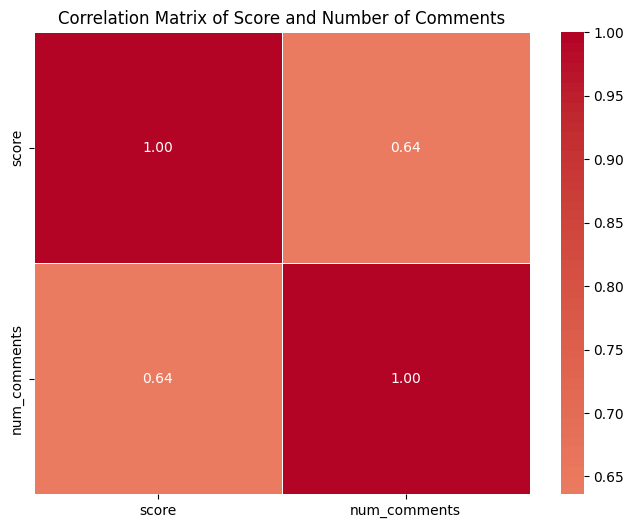

In [ ]:
correlation_matrix = eu_df[['score', 'num_comments']].corr()
import matplotlib.pyplot as plt

# Create a heatmap for the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Score and Number of Comments')
plt.show()

In [ ]:
print(correlation_matrix)

                 score  num_comments
score         1.000000      0.635985
num_comments  0.635985      1.000000


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the scaler
scaler = MinMaxScaler()

# Normalize 'score' and 'num_comments'
eu_df[['score_normalized', 'num_comments_normalized']] = scaler.fit_transform(
    eu_df[['score', 'num_comments']]
)

# Calculate the engagement score as the sum of normalized values
eu_df['engagement_score'] = eu_df['score_normalized'] + eu_df['num_comments_normalized']

# Group by classification and calculate the mean engagement score
engagement_by_classification = eu_df.groupby('classification')['engagement_score'].mean().reset_index()

# Sort the results by engagement score in descending order
engagement_by_classification = engagement_by_classification.sort_values(by='engagement_score', ascending=False)

print(engagement_by_classification)


          classification  engagement_score
0    Anti-Climate Change          0.009355
3     Pro-Climate Change          0.007824
2                Neutral          0.007412
1  Climate Change Denial          0.002820


In [ ]:
import altair as alt

# Bar chart showing average engagement score by classification
bar_chart = alt.Chart(engagement_by_classification).mark_bar().encode(
    x=alt.X('classification:N', sort='-y', title='Classification'),
    y=alt.Y('engagement_score:Q', title='Average Engagement Score'),
    color='classification:N',
    tooltip=['classification:N', 'engagement_score:Q']
).properties(
    title='Average Engagement Score by Classification',
    width=800,
    height=400
)

bar_chart


alt.Chart(...)

In [ ]:
import altair as alt

# Convert 'timestamps' to datetime if it isn't already
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# Ensure 'timestamps' is in datetime format and aggregate data by month
eu_df['yearmonth'] = eu_df['timestamps'].dt.to_period('M').astype(str)

# Create a multi-selection for classifications
classification_selection = alt.selection_multi(fields=['classification'], bind='legend')

# Line chart showing the trend of engagement scores over time
line_chart = alt.Chart(eu_df).mark_line().encode(
    x=alt.X('yearmonth:T', title='Time'),
    y=alt.Y('mean(engagement_score):Q', title='Average Engagement Score'),
    color='classification:N',
    tooltip=['classification:N', 'yearmonth:T', 'mean(engagement_score):Q']
).add_selection(
    classification_selection
).transform_filter(
    classification_selection
).properties(
    title='Trend of Engagement Scores Over Time by Classification',
    width=800,
    height=600
)

line_chart


C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'selection_multi' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.Chart(...)

In [ ]:
pip install vaderSentiment


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to get sentiment score
def get_sentiment_score(text):
    sentiment = analyzer.polarity_scores(text)
    return sentiment['compound']  # Compound score: overall sentiment

# Apply sentiment analysis to the 'combined_text' column
eu_df['sentiment_score'] = eu_df['combined_text'].apply(get_sentiment_score)

# Classify sentiment into categories
def classify_sentiment(score):
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply sentiment classification
eu_df['sentiment_classification'] = eu_df['sentiment_score'].apply(classify_sentiment)

# Convert timestamps to datetime and aggregate by month
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])
eu_df['yearmonth'] = eu_df['timestamps'].dt.to_period('M').astype(str)

# Aggregate data by month, classification, and sentiment classification
sentiment_by_time = eu_df.groupby(['yearmonth', 'classification', 'sentiment_classification'])['sentiment_score'].mean().reset_index()


In [ ]:

# Example DataFrame (replace this with your actual data processing)
# Make sure 'sentiment_classification' and 'yearmonth' are included in 'sentiment_by_time'
import pandas as pd

# Convert timestamps to datetime and aggregate by month
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])
eu_df['yearmonth'] = eu_df['timestamps'].dt.to_period('M').astype(str)

# Aggregate data by month, classification, and sentiment classification
sentiment_by_time = eu_df.groupby(['yearmonth', 'classification', 'sentiment_classification']).size().reset_index(name='count')


In [ ]:
pip install --upgrade altair


     -------------------------------------- 658.1/658.1 kB 3.0 MB/s eta 0:00:00
     -------------------------------------- 163.9/163.9 kB 5.0 MB/s eta 0:00:00
  Attempting uninstall: altair
    Found existing installation: altair 5.2.0
    Uninstalling altair-5.2.0:
      Successfully uninstalled altair-5.2.0
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
# Filter data to include only positive sentiment
positive_sentiment_df = eu_df[eu_df['sentiment_classification'] == 'Positive']# Aggregate data by month and classification for positive sentiment
classification_trend = positive_sentiment_df.groupby(['yearmonth', 'classification']).size().reset_index(name='count')



In [ ]:
import altair as alt

# Create the line chart
line_chart = alt.Chart(classification_trend).mark_line().encode(
    x=alt.X('yearmonth:T', title='Time'),
    y=alt.Y('count:Q', title='Count of Positive Sentiment Posts'),
    color='classification:N',
    tooltip=['yearmonth:T', 'classification:N', 'count:Q']
).properties(
    title='Trend of Classifications Over Time for Positive Sentiment',
    width=800,
    height=600
)

line_chart


alt.Chart(...)

In [ ]:
# Apply sentiment categorization
eu_df['sentiment_category'] = eu_df['sentiment_score'].apply(classify_sentiment)

# Group by classification, sentiment category, and time period (e.g., monthly)
sentiment_trends = eu_df.groupby([
    pd.Grouper(key='timestamps', freq='M'),  # Change to 'Y' for yearly trend
    'classification',
    'sentiment_category'
]).size().reset_index(name='count')

# Create a dropdown for classifications
classification_dropdown = alt.binding_select(options=list(eu_df['classification'].unique()), name='Classification')
classification_selection = alt.selection_single(fields=['classification'], bind=classification_dropdown, name='Select Classification')

# Create the line chart with Altair
line_chart = alt.Chart(sentiment_trends).mark_line(point=True).encode(
    x=alt.X('timestamps:T', title='Time'),
    y=alt.Y('count:Q', title='Number of Posts'),
    color=alt.Color('sentiment_category:N', scale=alt.Scale(scheme='viridis'), title='Sentiment'),
    tooltip=['timestamps:T', 'sentiment_category:N', 'count:Q']
).transform_filter(
    classification_selection
).properties(
    width=900,
    height=500,
    title='Sentiment Trends Over Time for Selected Classification'
).add_selection(
    classification_selection
).interactive()

# Display the chart
line_chart

C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'selection_single' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.Chart(...)

In [ ]:
# Apply sentiment classification
eu_df['sentiment_category'] = eu_df['sentiment_score'].apply(classify_sentiment)

# Convert timestamps to datetime
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])

# Group by classification, sentiment category, and time period (e.g., monthly)
sentiment_trends = eu_df.groupby([
    pd.Grouper(key='timestamps', freq='M'),  # Change to 'Y' for yearly trend
    'classification',
    'sentiment_category'
]).size().reset_index(name='count')

# Create dropdowns for classification and sentiment
classification_dropdown = alt.binding_select(options=list(eu_df['classification'].unique()), name='Classification')
sentiment_dropdown = alt.binding_select(options=list(eu_df['sentiment_category'].unique()), name='Sentiment')

# Define selections
classification_selection = alt.selection_single(fields=['classification'], bind=classification_dropdown, name='Select Classification')
sentiment_selection = alt.selection_single(fields=['sentiment_category'], bind=sentiment_dropdown, name='Select Sentiment')

# Create the line chart with Altair
line_chart = alt.Chart(sentiment_trends).mark_line(point=True).encode(
    x=alt.X('timestamps:T', title='Time'),
    y=alt.Y('count:Q', title='Number of Posts'),
    color=alt.Color('classification:N', scale=alt.Scale(scheme='set1'), title='Classification'),
    tooltip=['timestamps:T', 'classification:N', 'sentiment_category:N', 'count:Q']
).transform_filter(
    classification_selection & sentiment_selection
).properties(
    width=900,
    height=600,
    title='Sentiment Trends Over Time for Selected Classification and Sentiment'
).add_selection(
    classification_selection,
    sentiment_selection
).interactive()

# Display the chart
line_chart

C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'selection_single' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
C:\Code\hello\venv\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.Chart(...)

In [ ]:
import pandas as pd
import altair as alt

# Sample DataFrame setup (replace with actual data)
# Assume eu_df is already defined and contains 'sentiment_classification' and 'timestamps' columns

# Convert timestamps to datetime
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])
eu_df['yearmonth'] = eu_df['timestamps'].dt.to_period('M').astype(str)

# Filter data to include only positive sentiment
positive_sentiment_df = eu_df[eu_df['sentiment_classification'] == 'Positive']

# Aggregate data by month and classification for positive sentiment
classification_trend = positive_sentiment_df.groupby(['yearmonth', 'classification']).size().reset_index(name='count')

# Display the DataFrame
print(classification_trend)

# Optionally, you can also create and display the Altair chart for visualization
line_chart = alt.Chart(classification_trend).mark_line().encode(
    x=alt.X('yearmonth:T', title='Time'),
    y=alt.Y('count:Q', title='Count of Positive Sentiment Posts'),
    color='classification:N',
    tooltip=['yearmonth:T', 'classification:N', 'count:Q']
).properties(
    title='Trend of Classifications Over Time for Positive Sentiment',
    width=800,
    height=600
)

line_chart


    yearmonth       classification  count
0     2009-08   Pro-Climate Change      1
1     2009-09  Anti-Climate Change      1
2     2009-09   Pro-Climate Change      1
3     2010-08   Pro-Climate Change      1
4     2011-05   Pro-Climate Change      1
..        ...                  ...    ...
296   2023-11              Neutral      4
297   2023-11   Pro-Climate Change      6
298   2023-12  Anti-Climate Change      1
299   2023-12              Neutral     10
300   2023-12   Pro-Climate Change      3

[301 rows x 3 columns]


alt.Chart(...)

In [ ]:
import pandas as pd
import altair as alt

# Sample DataFrame setup (replace with actual data)
# Assume eu_df is already defined and contains 'sentiment_classification' and 'timestamps' columns

# Convert timestamps to datetime
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])
eu_df['year'] = eu_df['timestamps'].dt.year

# Filter data to include only positive sentiment
positive_sentiment_df = eu_df[eu_df['sentiment_classification'] == 'Positive']

# Aggregate data by year and classification for positive sentiment
classification_trendp = positive_sentiment_df.groupby(['year', 'classification']).size().reset_index(name='count')


# Create the line chart for year-wise data
line_chart = alt.Chart(classification_trendp).mark_line().encode(
    x=alt.X('year:O', title='Year'),  # 'O' for ordinal, since year is categorical
    y=alt.Y('count:Q', title='Count of Positive Sentiment Posts'),
    color='classification:N',
    tooltip=['year:O', 'classification:N', 'count:Q']
).properties(
    title='Trend of Classifications Over Time for Positive Sentiment (Yearly)',
    width=800,
    height=600
)

line_chart


alt.Chart(...)

In [ ]:
import pandas as pd
import altair as alt

# Sample DataFrame setup (replace with actual data)
# Assume eu_df is already defined and contains 'sentiment_classification' and 'timestamps' columns

# Convert timestamps to datetime
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])
eu_df['year'] = eu_df['timestamps'].dt.year

# Filter data to include only positive sentiment
positive_sentiment_df = eu_df[eu_df['sentiment_classification'] == 'Negative']

# Aggregate data by year and classification for positive sentiment
classification_trendn = positive_sentiment_df.groupby(['year', 'classification']).size().reset_index(name='count')


# Create the line chart for year-wise data
line_chart = alt.Chart(classification_trendn).mark_line().encode(
    x=alt.X('year:O', title='Year'),  # 'O' for ordinal, since year is categorical
    y=alt.Y('count:Q', title='Count of Negative Sentiment Posts'),
    color='classification:N',
    tooltip=['year:O', 'classification:N', 'count:Q']
).properties(
    title='Trend of Classifications Over Time for Negative Sentiment (Yearly)',
    width=800,
    height=600
)

line_chart


alt.Chart(...)

In [ ]:
import pandas as pd
import altair as alt

# Sample DataFrame setup (replace with actual data)
# Assume eu_df is already defined and contains 'sentiment_classification' and 'timestamps' columns

# Convert timestamps to datetime
eu_df['timestamps'] = pd.to_datetime(eu_df['timestamps'])
eu_df['year'] = eu_df['timestamps'].dt.year

# Filter data to include only positive sentiment
positive_sentiment_df = eu_df[eu_df['sentiment_classification'] == 'Neutral']

# Aggregate data by year and classification for positive sentiment
classification_trendnn = positive_sentiment_df.groupby(['year', 'classification']).size().reset_index(name='count')



# Create the line chart for year-wise data
line_chart = alt.Chart(classification_trendnn).mark_line().encode(
    x=alt.X('year:O', title='Year'),  # 'O' for ordinal, since year is categorical
    y=alt.Y('count:Q', title='Count of Neutral Sentiment Posts'),
    color='classification:N',
    tooltip=['year:O', 'classification:N', 'count:Q']
).properties(
    title='Trend of Classifications Over Time for Neutral Sentiment (Yearly)',
    width=800,
    height=600
)

line_chart


alt.Chart(...)

In [ ]:
pip install wordcloud

     -------------------------------------- 300.2/300.2 kB 1.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.Collecting nltk
     ---------------------------------------- 1.5/1.5 MB 2.2 MB/s eta 0:00:00
     ---------------------------------------- 97.9/97.9 kB 2.8 MB/s eta 0:00:00




[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import nltk

nltk.download('punkt')
nltk.download('wordnet')  # Ensure WordNet is also downloaded for lemmatization


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
pip install tqdm


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import altair as alt

# Aggregate data by classification and sentiment classification
engagement_trends = eu_df.groupby(['classification', 'sentiment_classification']).agg({
    'engagement_score': 'mean'  # Use 'sum' if you prefer total engagement
}).reset_index()

# Display the DataFrame
print(engagement_trends)

# Create a bar chart for engagement scores by classification and sentiment
engagement_chart = alt.Chart(engagement_trends).mark_bar().encode(
    x=alt.X('classification:N', title='Classification'),
    y=alt.Y('engagement_score:Q', title='Average Engagement Score'),
    color='sentiment_classification:N',
    column='sentiment_classification:N',
    tooltip=['classification:N', 'sentiment_classification:N', 'engagement_score:Q']
).properties(
    title='Average Engagement Score by Sentiment and Classification',
    width=300,
    height=200
)

engagement_chart


           classification sentiment_classification  engagement_score
0     Anti-Climate Change                 Negative          0.014074
1     Anti-Climate Change                  Neutral          0.005450
2     Anti-Climate Change                 Positive          0.005535
3   Climate Change Denial                 Negative          0.003050
4   Climate Change Denial                  Neutral          0.004073
5   Climate Change Denial                 Positive          0.001052
6                 Neutral                 Negative          0.007730
7                 Neutral                  Neutral          0.005316
8                 Neutral                 Positive          0.009820
9      Pro-Climate Change                 Negative          0.007672
10     Pro-Climate Change                  Neutral          0.006578
11     Pro-Climate Change                 Positive          0.008923


alt.Chart(...)

In [ ]:
from transformers import pipeline

emotion_pipeline = pipeline("text-classification", model="bhadresh-savani/bert-base-uncased-emotion")

def detect_emotion(text):
    chunks = split_text(text)
    results = [emotion_pipeline(chunk)[0] for chunk in chunks]
    labels = [result['label'] for result in results]
    scores = [result['score'] for result in results]

    avg_score = sum(scores) / len(scores)
    most_frequent_label = max(set(labels), key=labels.count)

    return most_frequent_label, avg_score


config.json:   0%|          | 0.00/935 [00:00<?, ?B/s]

C:\Code\hello\venv\Lib\site-packages\huggingface_hub\file_download.py:157: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\HP\.cache\huggingface\hub\models--bhadresh-savani--bert-base-uncased-emotion. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/285 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
import pandas as pd
from transformers import pipeline
from sklearn.preprocessing import LabelEncoder

# Initialize the emotion detection pipeline
emotion_pipeline = pipeline("text-classification", model="cardiffnlp/twitter-roberta-base-emotion")

# Function to split text into chunks of a given max length
def split_text(text, max_length=512):
    tokens = text.split()
    return [' '.join(tokens[i:i + max_length]) for i in range(0, len(tokens), max_length)]

# Function to detect emotion with error handling and aggregation
def detect_emotion(text):
    chunks = split_text(text)
    results = []

    for chunk in chunks:
        try:
            result = emotion_pipeline(chunk)[0]
            results.append(result)
        except Exception as e:
            print(f"Error processing chunk: {e}")
            continue  # Skip the chunk and move on

    if not results:
        return "Unknown", 0  # Default value if no results

    labels = [result['label'] for result in results]
    scores = [result['score'] for result in results]

    avg_score = sum(scores) / len(scores)  # Average score across chunks
    most_frequent_label = max(set(labels), key=labels.count)  # Most frequent label

    return most_frequent_label, avg_score



# Apply the emotion detection function
eu_df['emotion_label'], eu_df['emotion_score'] = zip(*eu_df['combined_text'].apply(detect_emotion))

# Save the DataFrame to a CSV file
eu_df.to_csv('eu_df_with_emotions.csv', index=False)

print("Emotion detection completed and data saved to 'eu_df_with_emotions.csv'.")


config.json:   0%|          | 0.00/768 [00:00<?, ?B/s]

C:\Code\hello\venv\Lib\site-packages\huggingface_hub\file_download.py:157: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\HP\.cache\huggingface\hub\models--cardiffnlp--twitter-roberta-base-emotion. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

Error processing chunk: The expanded size of the tensor (588) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 588].  Tensor sizes: [1, 514]
Error processing chunk: The expanded size of the tensor (544) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 544].  Tensor sizes: [1, 514]
Error processing chunk: The expanded size of the tensor (1170) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 1170].  Tensor sizes: [1, 514]
Error processing chunk: The expanded size of the tensor (647) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 647].  Tensor sizes: [1, 514]
Error processing chunk: The expanded size of the tensor (756) must match the existing size (514) at non-singleton dimension 1.  Target sizes: [1, 756].  Tensor sizes: [1, 514]
Error processing chunk: The expanded size of the tensor (660) must match the existing size (514) at non-singleton dime

In [ ]:
pip install altair vega_datasets



     -------------------------------------- 210.8/210.8 kB 2.6 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import pandas as pd
import altair as alt

# Assume eu_df is already loaded and contains 'emotion_label' and 'emotion_score' columns

# Count occurrences of each emotion label
emotion_counts = eu_df['emotion_label'].value_counts().reset_index()
emotion_counts.columns = ['emotion_label', 'count']

# Create a bar chart for emotion distribution
chart_emotion_distribution = alt.Chart(emotion_counts).mark_bar(color='skyblue').encode(
    x=alt.X('emotion_label:N', title='Emotion', sort=None),
    y=alt.Y('count:Q', title='Count'),
    tooltip=['emotion_label', 'count']
).properties(
    title='Emotion Distribution',
    width=600,
    height=400
).configure_axis(
    labelAngle=-45
)

# Create a DataFrame for emotion scores
emotion_scores_df = pd.DataFrame({'score': eu_df['emotion_score']})

# Create a histogram for emotion scores
chart_score_distribution = alt.Chart(emotion_scores_df).mark_bar(color='salmon').encode(
    alt.X('score:Q', bin=alt.Bin(maxbins=20), title='Score'),
    alt.Y('count():Q', title='Frequency'),
    tooltip=['score', 'count()']
).properties(
    title='Distribution of Emotion Scores',
    width=600,
    height=400
)




In [ ]:
import pandas as pd
import altair as alt

# Sample data (assuming eu_df is already loaded with 'emotion_label' and 'emotion_score')
# If the dataframe is not loaded, replace the below data with your actual data

# Count occurrences of each emotion label
emotion_counts = eu_df['emotion_label'].value_counts().reset_index()
emotion_counts.columns = ['emotion_label', 'count']

# Create a bar chart for emotion distribution
chart_emotion_distribution = alt.Chart(emotion_counts).mark_bar(color='skyblue').encode(
    x=alt.X('emotion_label:N', title='Emotion', sort=None),
    y=alt.Y('count:Q', title='Count'),
    tooltip=['emotion_label', 'count']
).properties(
    title='Emotion Distribution',
    width=700,
    height=500
).configure_axis(
    labelAngle=-45
)

# Create a DataFrame for emotion scores
emotion_scores_df = pd.DataFrame({'score': eu_df['emotion_score']})

# Create a histogram for emotion scores
chart_score_distribution = alt.Chart(emotion_scores_df).mark_bar(color='salmon').encode(
    alt.X('score:Q', bin=alt.Bin(maxbins=20), title='Score'),
    alt.Y('count():Q', title='Frequency'),
    tooltip=['score', 'count()']
).properties(
    title='Distribution of Emotion Scores',
    width=600,
    height=400
)

# Display the charts
chart_emotion_distribution.display()



alt.Chart(...)